# SetUp

Data Source: https://www.kaggle.com/praveengovi/emotions-dataset-for-nlp

## Imports

In [1]:
import pandas as pd

# visualization
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.graph_objs import *

# to avoid warnings 
import warnings
warnings.filterwarnings("ignore")

# wordcloud
from wordcloud import WordCloud

# text processing
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from gensim.models import word2vec

# hugging face transformers for sentiment analysis
from transformers import pipeline

# Keras imports
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Dense, Embedding, GlobalAveragePooling1D, Dropout, LSTM
from tensorflow.keras.layers.experimental.preprocessing import TextVectorization

# Scikit Learn imports
from sklearn.model_selection import train_test_split

import chart_studio
import chart_studio.plotly as py

## Notebook Configs

In [2]:
set_stop_words = set(stopwords.words("english"))
sentiment_analysis_pipeline = pipeline("sentiment-analysis")

username='royn5618'
api_key='Q3AuLxavQvaoBHPy5RgR'
chart_studio.tools.set_credentials_file(username=username, api_key=api_key)

## Data Imports

In [3]:
train_data = pd.read_csv('Data/train.txt', sep=';', names=['text', 'emotion'])
train_data.head()

,text,emotion
0,i didnt feel humiliated,sadness
1,i can go from feeling so hopeless to so damned...,sadness
2,im grabbing a minute to post i feel greedy wrong,anger
3,i am ever feeling nostalgic about the fireplac...,love
4,i am feeling grouchy,anger


In [4]:
test_data = pd.read_csv('Data/test.txt', sep=';', names=['text', 'emotion'])
test_data.head()

,text,emotion
0,im feeling rather rotten so im not very ambiti...,sadness
1,im updating my blog because i feel shitty,sadness
2,i never make her separate from me because i do...,sadness
3,i left with my bouquet of red and yellow tulip...,joy
4,i was feeling a little vain when i did this one,sadness


In [5]:
val_data = pd.read_csv('Data/val.txt', sep=';', names=['text', 'emotion'])
val_data.head()

,text,emotion
0,im feeling quite sad and sorry for myself but ...,sadness
1,i feel like i am still looking at a blank canv...,sadness
2,i feel like a faithful servant,love
3,i am just feeling cranky and blue,anger
4,i can have for a treat or if i am feeling festive,joy


# Basic EDA

## How much data?

In [6]:
len(train_data), len(test_data), len(val_data)

(16000, 2000, 2000)

## Missing Values

In [7]:
if not train_data.isna().sum().any() and not test_data.isna().sum().any():
    print("No Null Values detected")
else:
    print("Null Values detected")

No Null Values detected


## Data Distribution by Emotions

In [8]:
emotions_order = list(train_data.emotion.unique())
emotions_order

['sadness', 'anger', 'love', 'surprise', 'fear', 'joy']

In [9]:
emotions_color = ['blue', 'red', 'pink', 'green', 'grey', 'yellow']

In [10]:
dict_emo_color = {}
for each_emo, each_color in zip(emotions_order, emotions_color):
    dict_emo_color[each_emo] = each_color
    
dict_emo_color

{'sadness': 'blue',
 'anger': 'red',
 'love': 'pink',
 'surprise': 'green',
 'fear': 'grey',
 'joy': 'yellow'}

In [11]:
fig = px.histogram(train_data,
                   x="emotion",
                   template='plotly_white',
                   color='emotion',
                   category_orders = {'emotion': emotions_order}
                  )
fig.update_layout(
    title={
        'text': "Row Count of <b>Train Data</b> by Emotion Tags",
        'x' : 0.5,
        'xanchor': 'center'
    })
fig.update_yaxes(title='Number of Rows').update_xaxes(title='Emotions')
fig.show()

In [12]:
# py.plot(fig, filename="Row Count by Emotion Tags Train", auto_open = True)

In [13]:
fig = px.histogram(test_data,
                   x="emotion",
                   template='plotly_white',
                   color='emotion',
                   category_orders={'emotion': emotions_order})
fig.update_layout(
    title={
        'text': "Row Count of <b>Test Data</b> by Emotion Tags",
        'x': 0.5,
        'xanchor': 'center'
    })
fig.update_yaxes(title='Number of Rows').update_xaxes(title='Emotions')
fig.show()

In [14]:
# py.plot(fig, filename="Row Count by Emotion Tags Test", auto_open = True)

## Wordcloud for Most Frequently Occuring Words

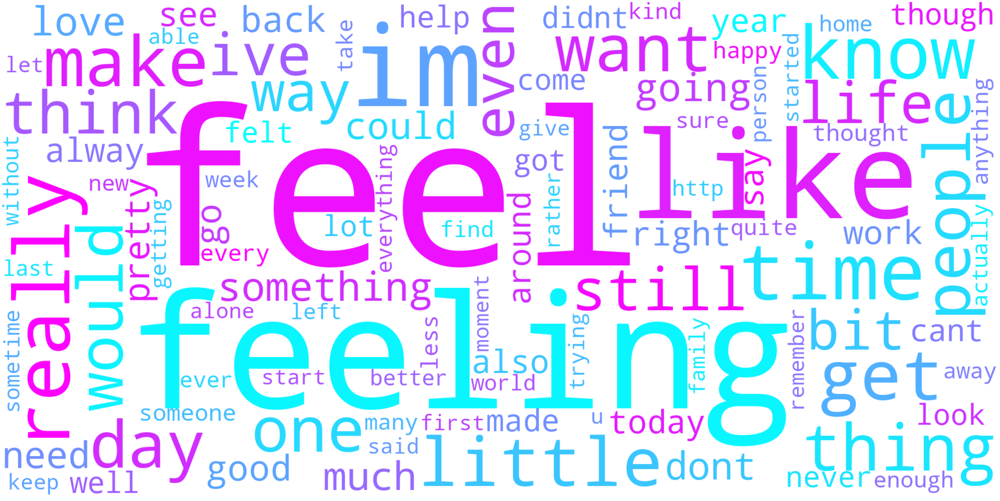

In [15]:
wordcloud = WordCloud(width=2000,
                      height=1000,
                      max_words=100,
                      normalize_plurals=True,
                      font_step=1,
                      relative_scaling=0.5,
                      collocations=False,
                      stopwords = set_stop_words,
                      background_color="white",
                      colormap='cool',
                      include_numbers=False).generate(" ".join(list(train_data.text)))

plt.figure(figsize = (80, 50), facecolor = None)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

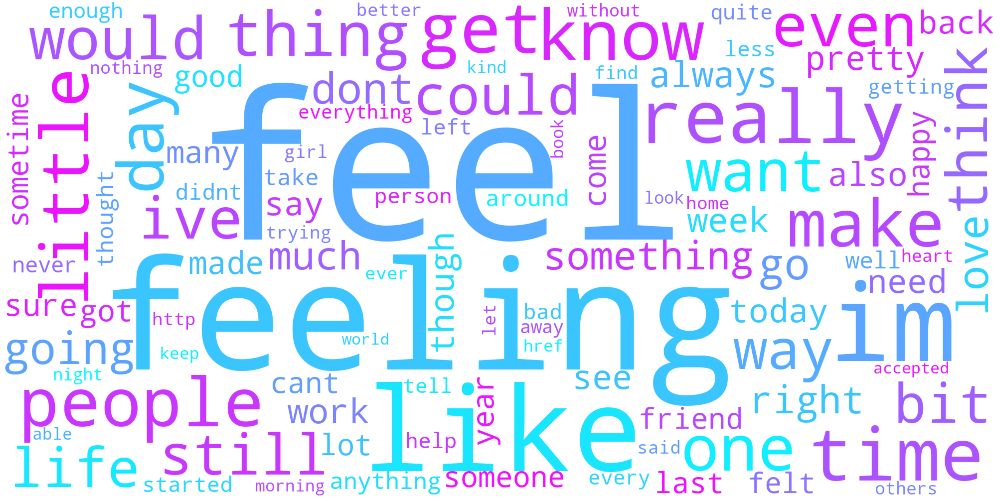

In [16]:
wordcloud = WordCloud(width=2000,
                      height=1000,
                      max_words=100,
                      normalize_plurals=True,
                      font_step=1,
                      relative_scaling=0.5,
                      collocations=False,
                      stopwords = set_stop_words,
                      background_color="white",
                      colormap='cool',
                      include_numbers=False).generate(" ".join(list(test_data.text)))

plt.figure(figsize = (80, 50), facecolor = None)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [17]:
def generate_wordcloud(emotion, colormap, text_data): 
    wordcloud = WordCloud(width=500,
                          height=300,
                          max_words=100,
                          normalize_plurals=True,
                          font_step=1,
                          relative_scaling=0.5,
                          collocations=False,
                          stopwords = set_stop_words,
                          background_color="white",
                          colormap=colormap,
                          include_numbers=False).generate(" ".join(list(text_data.text)))
    plt.title('Emotion: ' + emotion)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.show()

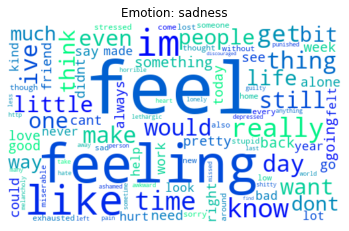

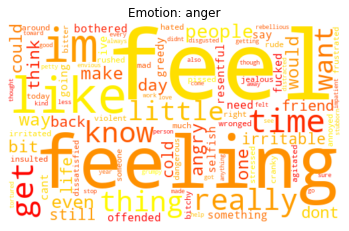

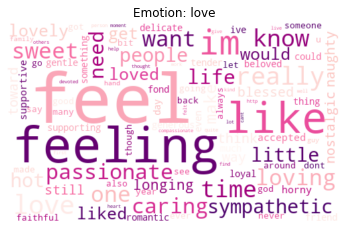

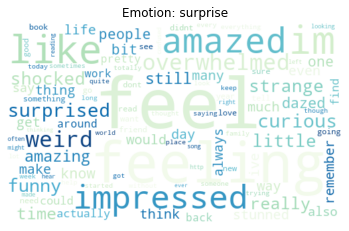

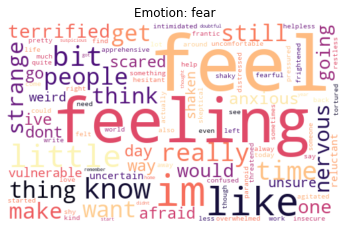

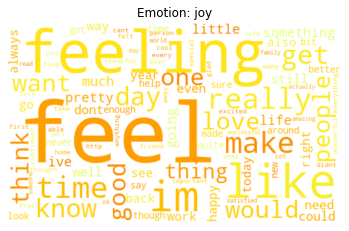

In [18]:
colormaps = {
    'sadness' : 'winter',
    'anger' : 'autumn',
    'love' : 'RdPu',
    'surprise' : 'GnBu',
    'fear' : 'magma',
    'joy' : 'Wistia'
}

for each_cat in train_data.emotion.unique():
    generate_wordcloud(each_cat, colormaps[each_cat], train_data[train_data['emotion'] == each_cat])

##  Text Length Analysis

In [19]:
train_data['length_text'] = train_data.text.apply(len)
test_data['length_text'] = test_data.text.apply(len)

In [20]:
fig = px.box(train_data,
             x='emotion',
             y='length_text',
             color='emotion',
             category_orders={'emotion': emotions_order})
fig.update_yaxes(title='Text Length').update_xaxes(title='Emotions')
fig.show()

In [21]:
fig = px.box(test_data,
             x='emotion',
             y='length_text',
             color='emotion',
             category_orders={'emotion': emotions_order})
fig.update_yaxes(title='Text Length').update_xaxes(title='Emotions')
fig.show()

## Data Distribution per Emotion by Sentiment

In [22]:
train_data['sentiment_hf'] = train_data.text.apply(sentiment_analysis_pipeline)
test_data['sentiment_hf'] = test_data.text.apply(sentiment_analysis_pipeline)

In [23]:
train_data.head()

,text,emotion,length_text,sentiment_hf
0,i didnt feel humiliated,sadness,23,"[{'label': 'POSITIVE', 'score': 0.891336083412..."
1,i can go from feeling so hopeless to so damned...,sadness,108,"[{'label': 'POSITIVE', 'score': 0.966551005840..."
2,im grabbing a minute to post i feel greedy wrong,anger,48,"[{'label': 'NEGATIVE', 'score': 0.999305427074..."
3,i am ever feeling nostalgic about the fireplac...,love,92,"[{'label': 'POSITIVE', 'score': 0.965797424316..."
4,i am feeling grouchy,anger,20,"[{'label': 'NEGATIVE', 'score': 0.999391376972..."


In [24]:
train_data['sentiment_hf'] = train_data['sentiment_hf'].apply(lambda x : x[0]['label'])
test_data['sentiment_hf'] = test_data['sentiment_hf'].apply(lambda x : x[0]['label'])

In [25]:
fig = px.histogram(train_data,
             x="emotion",
             template='plotly_white',
             color='sentiment_hf',
             category_orders={'emotion': emotions_order})
fig.update_layout(
    title={
        'text': "<b>Train Data</b> Distribution <b>per Emotion by Sentiment</b>",
        'x': 0.5,
        'xanchor': 'center'
    })
fig.update_yaxes(title='Number of Rows').update_xaxes(title='Emotions')
fig.show()

In [26]:
fig = px.histogram(test_data,
             x="emotion",
             template='plotly_white',
             color='sentiment_hf',
             category_orders={'emotion': emotions_order})
fig.update_layout(
    title={
        'text': "<b>Test Data</b> Distribution <b>per Emotion by Sentiment</b>",
        'x': 0.5,
        'xanchor': 'center'
    })
fig.update_yaxes(title='Number of Rows').update_xaxes(title='Emotions')
fig.show()

# Data Preparation

## Label Encoding

In [27]:
train_data["emotion"] = train_data["emotion"].astype('category')
train_data["emotion_label"] = train_data["emotion"].cat.codes
train_data.head()

,text,emotion,length_text,sentiment_hf,emotion_label
0,i didnt feel humiliated,sadness,23,POSITIVE,4
1,i can go from feeling so hopeless to so damned...,sadness,108,POSITIVE,4
2,im grabbing a minute to post i feel greedy wrong,anger,48,NEGATIVE,0
3,i am ever feeling nostalgic about the fireplac...,love,92,POSITIVE,3
4,i am feeling grouchy,anger,20,NEGATIVE,0


In [28]:
test_data["emotion"] = test_data["emotion"].astype('category')
test_data["emotion_label"] = test_data["emotion"].cat.codes
test_data.head()

,text,emotion,length_text,sentiment_hf,emotion_label
0,im feeling rather rotten so im not very ambiti...,sadness,59,NEGATIVE,4
1,im updating my blog because i feel shitty,sadness,41,NEGATIVE,4
2,i never make her separate from me because i do...,sadness,97,POSITIVE,4
3,i left with my bouquet of red and yellow tulip...,joy,113,POSITIVE,2
4,i was feeling a little vain when i did this one,sadness,47,NEGATIVE,4


## One Hot Encoding and Train Test Data Prep

In [29]:
train_features, train_labels = train_data['text'], tf.one_hot(
    train_data["emotion_label"], 6)
test_features, test_labels = test_data['text'], tf.one_hot(
    test_data["emotion_label"], 6)

In [30]:
train_features[:5]

0                              i didnt feel humiliated
1    i can go from feeling so hopeless to so damned...
2     im grabbing a minute to post i feel greedy wrong
3    i am ever feeling nostalgic about the fireplac...
4                                 i am feeling grouchy
Name: text, dtype: object

In [31]:
train_labels[:5]

<tf.Tensor: shape=(5, 6), dtype=float32, numpy=
array([[0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0.],
       [1., 0., 0., 0., 0., 0.]], dtype=float32)>

# Generate Word Embeddings

## Analyze & select max_sequnce_length

In [32]:
tokenized_train_features = [word_tokenize(each_train_text) for each_train_text in train_features]
tokenized_test_features = [word_tokenize(each_test_text) for each_test_text in test_features]

In [33]:
list_len_text_by_words = [len(each_tokenized_text) for each_tokenized_text in tokenized_train_features]

In [34]:
fig = px.histogram(
    x=list_len_text_by_words,
    template='plotly_white'
)
fig.update_layout(
    title={
        'text': "Histogram of <b>Sentence Length</b> by Number of Words",
        'x': 0.4,
        'xanchor': 'center'
    })
fig.update_yaxes(title='Frequency').update_xaxes(
    title='Length of Sentences by Words')
fig.update_layout(showlegend=False)
fig.update_layout(hovermode='x')
fig.show()

In [35]:
vector_size = 300

In [36]:
w2v_model = word2vec.Word2Vec(
    tokenized_train_features + tokenized_test_features,
    vector_size=vector_size,  # Dimensionality of the word vectors
    window=20,
    min_count=1,
    sg=1  # 1 for skip-gram; otherwise CBOW
)
w2v_model

In [37]:
# Vocabulary
len(w2v_model.wv)

16182

In [38]:
# Similar Terms Check
w2v_model.wv.most_similar('sad', topn=10)

[('lonely', 0.9148741364479065),
 ('horribly', 0.8844801783561707),
 ('angry', 0.877587616443634),
 ('confused', 0.8772882223129272),
 ('bitchy', 0.8743071556091309),
 ('coz', 0.8701295852661133),
 ('aggravated', 0.8688035011291504),
 ('upset', 0.8680659532546997),
 ('unhappy', 0.8648388385772705),
 ('insecure', 0.8610806465148926)]

In [39]:
# Configs for Embedding Layer
vocab_size = len(w2v_model.wv)
max_seq_len = 20

# Get the embedding matrix
vocab = w2v_model.wv.key_to_index.keys()
embedding_matrix = w2v_model.wv[vocab]

In [40]:
vocab_size, vector_size, max_seq_len

(16182, 300, 20)

## Text to Sequences using Gensim

In [41]:
def w2v_indexed_token_sequences(w2v_model, list_features):
    indexed_features = []
    for each_seq in list_features:
        list_token_indices = []
        for each_token in each_seq:
            try:
                list_token_indices.append(w2v_model.wv.key_to_index[each_token])
            except KeyError as e:
                continue
        indexed_features.append(list_token_indices)
    return indexed_features

In [42]:
indexed_train_features = w2v_indexed_token_sequences(w2v_model, tokenized_train_features)

indexed_test_features = w2v_indexed_token_sequences(w2v_model, tokenized_test_features)

len(indexed_train_features), len(indexed_test_features)

(16000, 2000)

## Standardize Sequence Length as Selected Earlier

In [43]:
padded_train = pad_sequences(indexed_train_features, padding = 'post', maxlen=max_seq_len, truncating='post')
padded_test = pad_sequences(indexed_test_features, padding = 'post', maxlen=max_seq_len, truncating='post')

In [44]:
# Check all sequences have same length

list_len_text_by_words = [len(each) for each in padded_train]

fig = px.histogram(
    x=list_len_text_by_words,
    template='plotly_white'
)
fig.update_layout(
    title={
        'text': "Histogram of <b>Sentence Length</b> by Number of Words",
        'x': 0.4,
        'xanchor': 'center'
    })
fig.update_yaxes(title='Frequency').update_xaxes(
    title='Length of Sentences by Words')
fig.update_layout(showlegend=False)
fig.update_layout(hovermode='x')
fig.show()

# Multiclass Classifier

In [45]:
def get_model():
    model = Sequential()
    model.add(
        Embedding(input_dim=vocab_size,
                  output_dim=vector_size,
                  weights=[embedding_matrix],
                  input_length=max_seq_len))
    model.add(Dropout(0.6))
    model.add(LSTM(max_seq_len,return_sequences=True))
    model.add(LSTM(6))
    model.add(Dense(6,activation='softmax'))
    return model

In [46]:
model = get_model()
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 20, 300)           4854600   
_________________________________________________________________
dropout (Dropout)            (None, 20, 300)           0         
_________________________________________________________________
lstm (LSTM)                  (None, 20, 20)            25680     
_________________________________________________________________
lstm_1 (LSTM)                (None, 6)                 648       
_________________________________________________________________
dense (Dense)                (None, 6)                 42        
Total params: 4,880,970
Trainable params: 4,880,970
Non-trainable params: 0
_________________________________________________________________


In [47]:
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [48]:
tf.config.run_functions_eagerly(True)
history = model.fit(padded_train, 
                    train_labels,
                    validation_split=0.33,
                    epochs=5)

Epoch 1/5


UnknownError: Fail to find the dnn implementation. [Op:CudnnRNN]

In [ ]:
metric_to_plot = "loss"
epochs = list(range(1, max(history.epoch) + 2))
training_loss = history.history[metric_to_plot]
validation_loss = history.history["val_" + metric_to_plot]

trace1 = {
    "mode": "lines+markers",
    "name": "Training Loss",
    "type": "scatter",
    "x": epochs,
    "y": training_loss
}

trace2 = {
    "mode": "lines+markers",
    "name": "Validation Loss",
    "type": "scatter",
    "x": epochs,
    "y": validation_loss
}

data = Data([trace1, trace2])
layout = {
    "title": "Training - Validation Loss",
    "xaxis": {
        "title": "Number of epochs",
        "titlefont": {
            "size": 18,
            "color": "#7f7f7f"
        }
    },
    "yaxis": {
        "title": "Loss",
        "titlefont": {
            "size": 18,
            "color": "#7f7f7f"
        }
    }
}
fig = Figure(data=data, layout=layout)
fig.update_layout(hovermode="x unified")
fig.show()

In [ ]:
metric_to_plot = "accuracy"
epochs = list(range(1, max(history.epoch) + 2))
training_loss = history.history[metric_to_plot]
validation_loss = history.history["val_" + metric_to_plot]

trace1 = {
    "mode": "lines+markers",
    "name": "Training Accuracy",
    "type": "scatter",
    "x": epochs,
    "y": training_loss
}

trace2 = {
    "mode": "lines+markers",
    "name": "Validation Accuracy",
    "type": "scatter",
    "x": epochs,
    "y": validation_loss
}

data = Data([trace1, trace2])
layout = {
    "title": "Training - Validation Accuracy",
    "xaxis": {
        "title": "Number of epochs",
        "titlefont": {
            "size": 18,
            "color": "#7f7f7f"
        }
    },
    "yaxis": {
        "title": "Accuracy",
        "titlefont": {
            "size": 18,
            "color": "#7f7f7f"
        }
    }
}
fig = Figure(data=data, layout=layout)
fig.update_layout(hovermode="x unified")
fig.show()

In [ ]:
y_pred_one_hot_encoded = (model.predict(padded_train)> 0.5).astype("int32")

In [ ]:
y_pred_one_hot_encoded

In [ ]:
y_pred = np.array(tf.argmax(y_pred_one_hot_encoded, axis=1))

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(train_data['emotion_label'], y_pred))

In [ ]:
y_pred_one_hot_encoded = (model.predict(padded_test)> 0.5).astype("int32")
y_pred = np.array(tf.argmax(y_pred_one_hot_encoded, axis=1))
print(classification_report(test_data['emotion_label'], y_pred))

In [ ]:
print('pr yu')